# Import library
<style>
r { color: Red }
o { color: Orange }
g { color: Green }
</style>

## TODOs:

- <r>TODO:</r> Important thing to do
- <o>TODO:</o> Less important thing to do
- <g>DONE:</g> Breath deeply and improve karma

This sentence uses `$` delimiters to show math inline:  $\sqrt{3x-1}+(1+x)^2$ 
Xét Robot ri đang trong trạng thái dừng chuyển động
(Robot.status = 3) có điểm tiếp theo trong lộ trình là Γi:
• Nếu Γi ∈ Ω → ri vẫn dừng di chuyển, Robot.status = 3.
• Nếu Γi /∈ Ω → ri chuyển trạng thái sang di chuyển theo
lộ trình.

In [101]:
import cv2
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import sys


# Bài 1: introduction


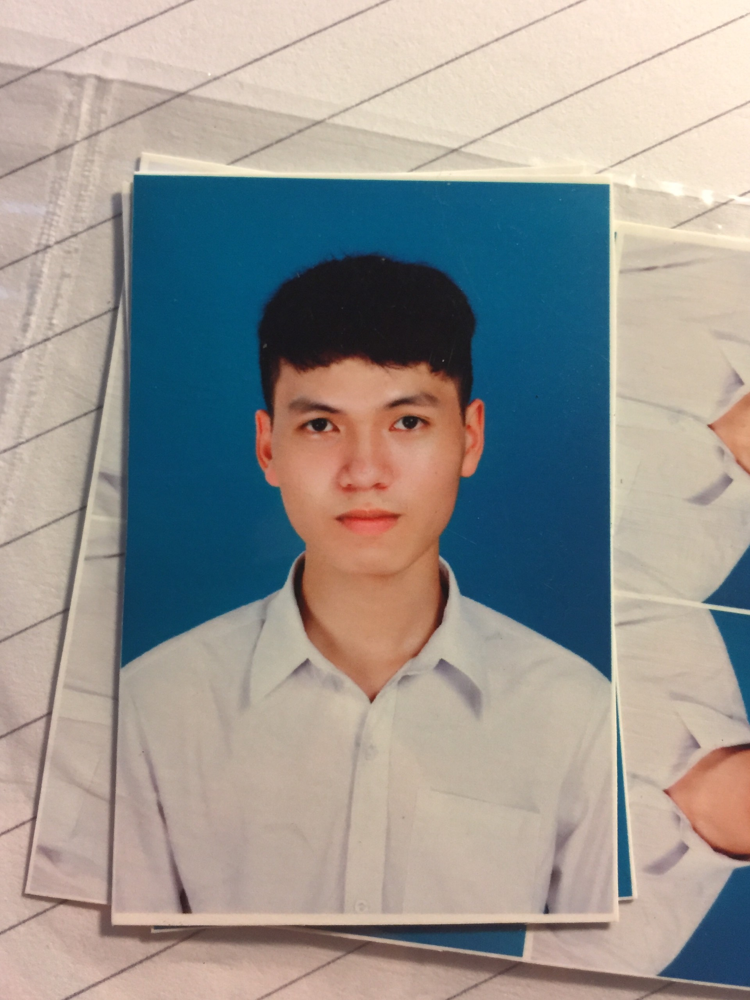

In [36]:
Image(filename='b.jpg')

## Image attributes

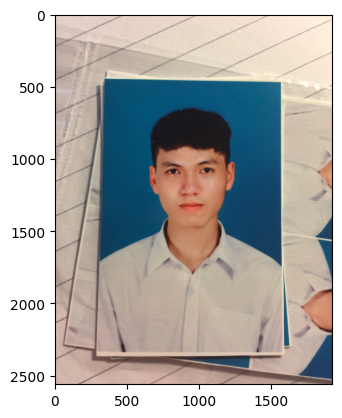

In [37]:
b_img_bgr = cv2.imread('b.jpg', 1)
# print("attri: \n",b_img)
b_img_rgb = b_img_bgr[:,:,::-1]
plt.imshow(b_img_rgb)

In [38]:
print("size:", b_img_rgb.shape)
print("data type:", b_img_rgb.dtype)

size: (2560, 1920, 3)
data type: uint8


# Bài 2: crop, resize, flip

In [39]:
# img_NZ_rgb_flipped_horz = cv2.flip(img_NZ_rgb, 1)
# img_NZ_rgb_flipped_vert = cv2.flip(img_NZ_rgb, 0)
# img_NZ_rgb_flipped_both = cv2.flip(img_NZ_rgb, -1)

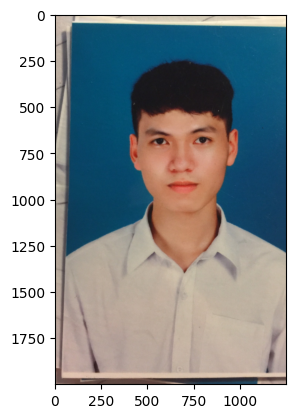

In [40]:
crop_region = b_img_rgb[400:2400, 250:1500]
plt.imshow(crop_region)

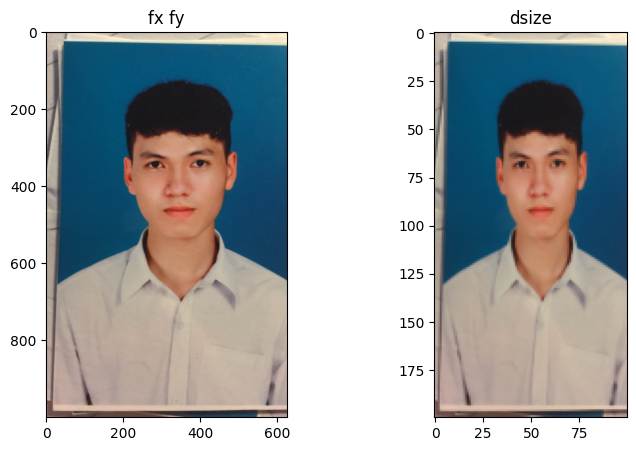

In [41]:
resize_crop_f = cv2.resize(crop_region, None, fx=0.5,fy=0.5)
dim = (100,200)
resize_crop_d = cv2.resize(crop_region, dsize=dim, interpolation=cv2.INTER_AREA)
plt.figure(figsize=(18, 5))
plt.subplot(141);plt.imshow(resize_crop_f);plt.title("fx fy");
plt.subplot(142);plt.imshow(resize_crop_d);plt.title("dsize");

# Bài 3: Line, rect, cir, text

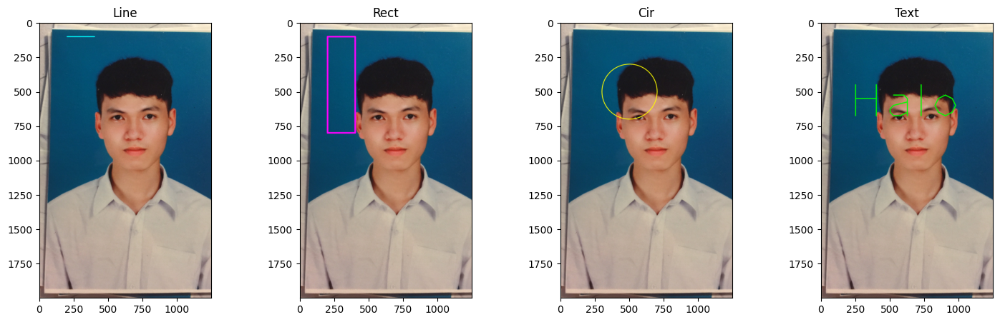

In [42]:
imageLine = crop_region.copy()
imageRect = crop_region.copy()
imageCir = crop_region.copy()
imageText = crop_region.copy()
cv2.line(imageLine, (200, 100), (400, 100), (0, 255, 255), thickness=5, lineType=cv2.LINE_AA)
cv2.rectangle(imageRect, (200, 100), (400, 800), (255, 0, 255), thickness=10, lineType=cv2.LINE_AA)
cv2.circle(imageCir, (500, 500), 200, (255, 255, 0), thickness=4, lineType=cv2.LINE_AA)

text = "Halo"
fontScale = 25
fontFace = cv2.FONT_HERSHEY_PLAIN
fontColor = (0, 255, 0)
fontThickness = 6
cv2.putText(imageText, text, (200, 700), fontFace, fontScale, fontColor, fontThickness, cv2.LINE_AA);

plt.figure(figsize=(18, 5))
plt.subplot(141);plt.imshow(imageLine);plt.title("Line");
plt.subplot(142);plt.imshow(imageRect);plt.title("Rect");
plt.subplot(143);plt.imshow(imageCir);plt.title("Cir");
plt.subplot(144);plt.imshow(imageText);plt.title("Text");

# Bài 4: Threshold, add, subtract, multiple, clip, and, or, xor, not

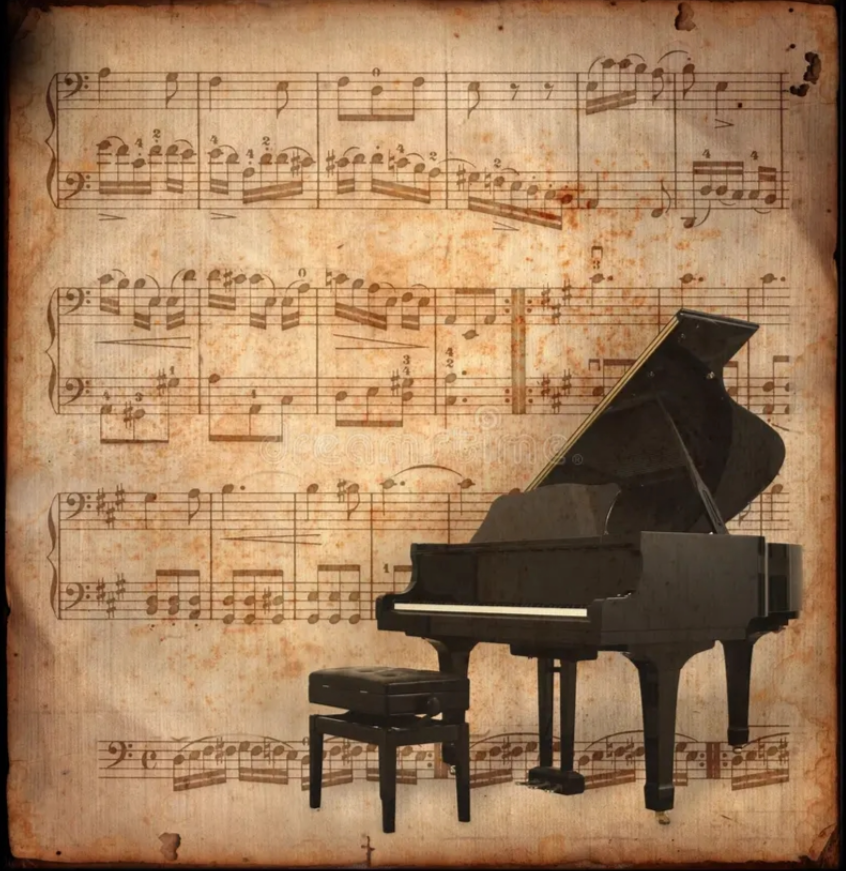

In [43]:
img_bgr = cv2.imread("note1.png", cv2.IMREAD_GRAYSCALE)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Display 18x18 pixel image.
Image(filename="note1.png")

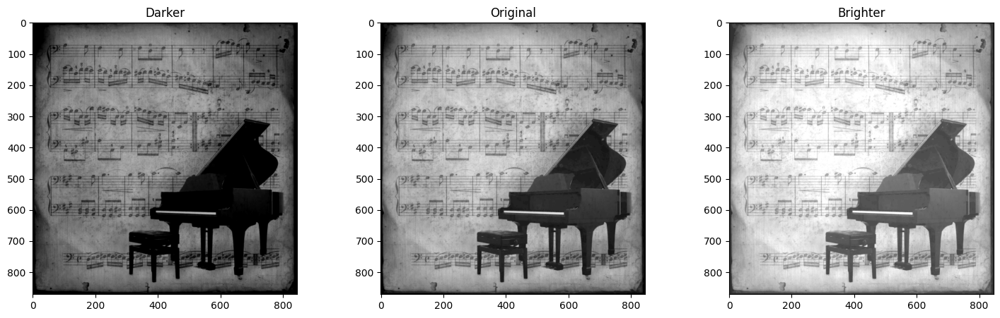

In [44]:
matrix = np.ones(img_rgb.shape, dtype="uint8") * 50

img_rgb_brighter = cv2.add(img_rgb, matrix)
img_rgb_darker   = cv2.subtract(img_rgb, matrix)


# Show the images
plt.figure(figsize=[18, 5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Darker");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Brighter");

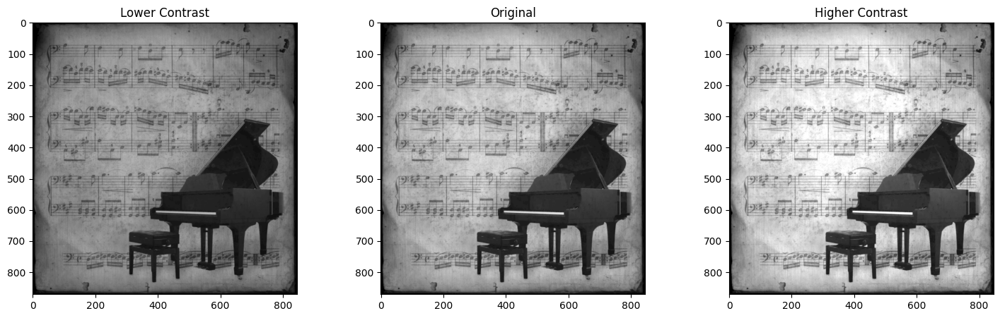

In [45]:
matrix_low_contrast = np.ones(img_rgb.shape) * 0.8
matrix_high_contast = np.ones(img_rgb.shape) * 1.2

# img_rgb_darker   = np.uint8(cv2.multiply(np.float64(img_rgb), matrix_low_contrast))
# img_rgb_brighter = np.uint8(cv2.multiply(np.float64(img_rgb), matrix_high_contast))
img_rgb_darker   = np.uint8(np.clip(cv2.multiply(np.float64(img_rgb), matrix_low_contrast),0,255))
img_rgb_brighter = np.uint8(np.clip(cv2.multiply(np.float64(img_rgb), matrix_high_contast),0,255))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Lower Contrast");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Higher Contrast");

[[  0   0   0   0   0   0   0   0   0   0]
 [255 255 255 255 255 255 255 255 255 255]
 [255 255 255 255 255 255 255 255 255 255]
 [255 255 255 255 255 255 255 255 255 255]
 [255 255 255 255 255 255 255 255 255 255]
 [255 255 255 255 255 255 255 255 255 255]
 [255 255 255 255 255 255 255 255 255 255]
 [255 255 255 255 255 255 255 255 255 255]
 [  0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0]]


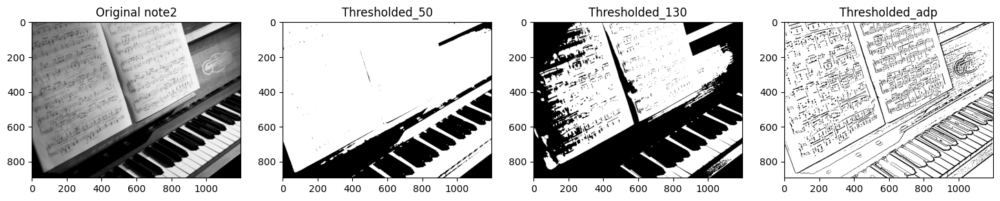

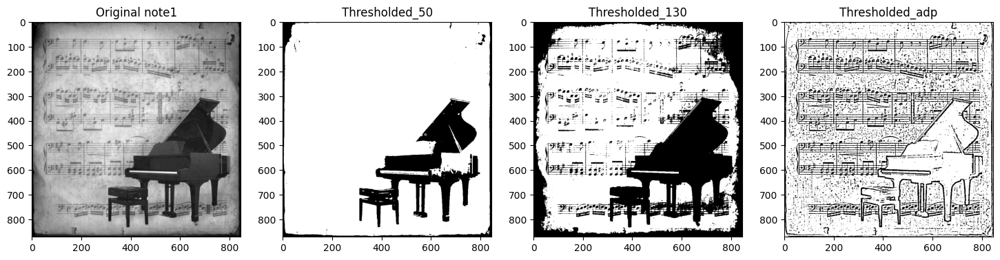

In [46]:
img_read = cv2.imread("note2.png", cv2.IMREAD_GRAYSCALE)
retval, img_thresh_1 = cv2.threshold(img_read, 50, 255, cv2.THRESH_BINARY)
retval, img_thresh_2 = cv2.threshold(img_read, 130, 255, cv2.THRESH_BINARY)
img_thresh_adp = cv2.adaptiveThreshold(img_read, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 7)
# Show the images
plt.figure(figsize=[18, 5])

plt.subplot(141);plt.imshow(img_read, cmap="gray");  plt.title("Original note2")
plt.subplot(142);plt.imshow(img_thresh_1, cmap="gray");plt.title("Thresholded_50")
plt.subplot(143);plt.imshow(img_thresh_2, cmap="gray");plt.title("Thresholded_130")
plt.subplot(144);plt.imshow(img_thresh_adp, cmap="gray");plt.title("Thresholded_adp")

img_read = cv2.imread("note1.png", cv2.IMREAD_GRAYSCALE)
retval, img_thresh_1 = cv2.threshold(img_read, 50, 255, cv2.THRESH_BINARY)
retval, img_thresh_2 = cv2.threshold(img_read, 130, 255, cv2.THRESH_BINARY)
img_thresh_adp = cv2.adaptiveThreshold(img_read, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 7)
# Show the images
plt.figure(figsize=[18, 5])

plt.subplot(141);plt.imshow(img_read, cmap="gray");  plt.title("Original note1")
plt.subplot(142);plt.imshow(img_thresh_1, cmap="gray");plt.title("Thresholded_50")
plt.subplot(143);plt.imshow(img_thresh_2, cmap="gray");plt.title("Thresholded_130")
plt.subplot(144);plt.imshow(img_thresh_adp, cmap="gray");plt.title("Thresholded_adp")
# plt.imshow(cv2.add(img_thresh_1, img_thresh_2), cmap="gray")
# print(img_thresh.shape)
print(img_thresh_adp[100:110,100:110])

(768, 768, 3)


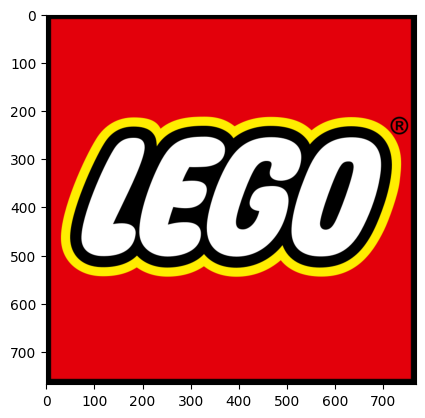

In [47]:
img_bgr = cv2.imread("LEGO.png")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

print(img_rgb.shape)

logo_h = img_rgb.shape[0]
logo_w = img_rgb.shape[1]

(768, 768, 3)


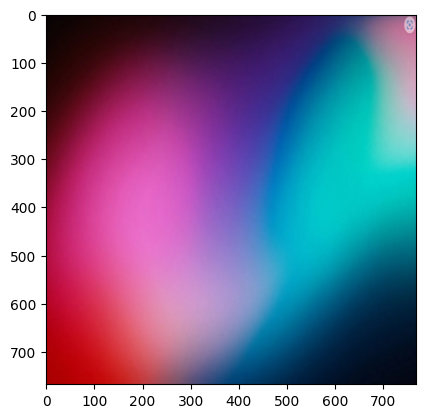

In [48]:
# Read in image of color cheackerboad background
img_background_bgr = cv2.imread("gradient1.png")
img_background_rgb = cv2.cvtColor(img_background_bgr, cv2.COLOR_BGR2RGB)

# Resize background image to same size as logo image
img_background_rgb = cv2.resize(img_background_rgb, (logo_w, logo_h), interpolation=cv2.INTER_AREA)

plt.imshow(img_background_rgb)
print(img_background_rgb.shape)

### <font color="green">create mask </font>

(768, 768)


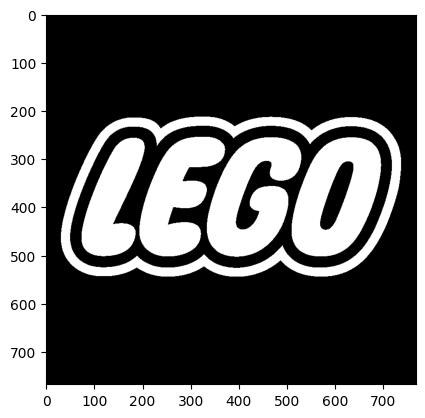

In [49]:
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# Apply global thresholding to creat a binary mask of the logo
retval, img_mask = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)

plt.imshow(img_mask, cmap="gray")
print(img_mask.shape)

### <font color="green">Invert the Mask </font>

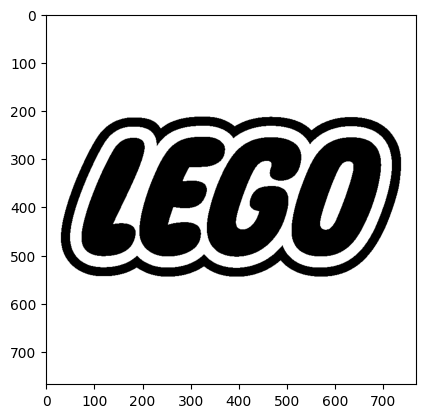

In [50]:
# Create an inverse mask
img_mask_inv = cv2.bitwise_not(img_mask)
plt.imshow(img_mask_inv, cmap="gray")

### <font color="green">Apply background on the Mask</font>

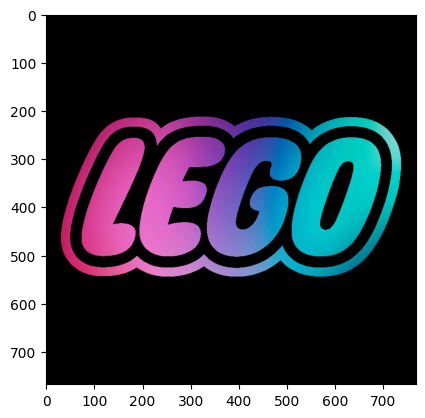

In [51]:
# Create colorful background "behind" the logo lettering
img_background = cv2.bitwise_and(img_background_rgb, img_background_rgb, mask=img_mask)
plt.imshow(img_background)

### <font color="green">Isolate foreground from image</font>

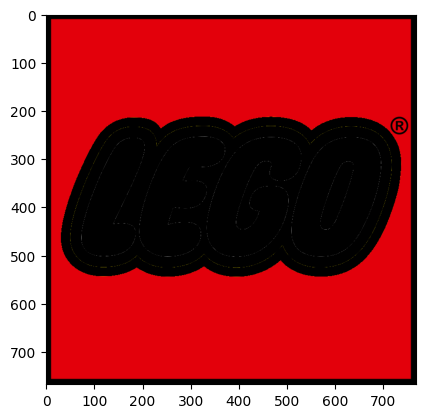

In [52]:
# Isolate foreground (red from original image) using the inverse mask
img_foreground = cv2.bitwise_and(img_rgb, img_rgb, mask=img_mask_inv)
plt.imshow(img_foreground)

### <font color="green">Result: Merge Foreground and Background</font>

True

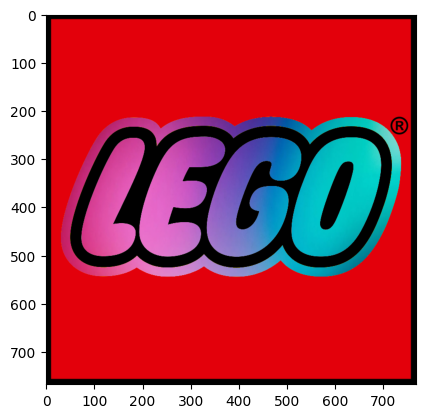

In [53]:
# Add the two previous results obtain the final result
result = cv2.add(img_background, img_foreground)
plt.imshow(result)
cv2.imwrite("logo_final.png", result[:, :, ::-1])

# Bài 5: Camera


In [54]:
s = 0
# if len(sys.argv) > 2:  # chưa rõ tác dụng, có hay không vẫn hoạt động
#     s = sys.argv[1]

source = cv2.VideoCapture(s)
win_name = "CameraWin1"
cv2.namedWindow(win_name, cv2.WINDOW_NORMAL)
while cv2.waitKey(1) != 27: # Escape:
    has_frame, frame = source.read()
    if not has_frame  :
        break
    cv2.imshow(win_name, frame)

source.release()
cv2.destroyWindow(win_name)

# Bài 6: Camera writing (chuyển đổi video đuôi này sang đuôi khác)

# Bài 7: Image filtering (edge detection)

In [55]:
PREVIEW  = 0  # Preview Mode
BLUR     = 1  # Blurring Filter
FEATURES = 2  # Corner Feature Detector
CANNY    = 3  # Canny Edge Detector

feature_params = dict(maxCorners=500, qualityLevel=0.2, minDistance=15, blockSize=9)
s = 0
if len(sys.argv) > 2:
    s = sys.argv[1]

image_filter = PREVIEW
alive = True

win_name = "Camera Filters"
cv2.namedWindow(win_name, cv2.WINDOW_NORMAL)
result = None

source = cv2.VideoCapture(s)

while alive:
    has_frame, frame = source.read()
    if not has_frame:
        break

    frame = cv2.flip(frame, 1)

    if image_filter == PREVIEW:
        result = frame
    elif image_filter == CANNY:
        result = cv2.Canny(frame, 80, 150)
    elif image_filter == BLUR:
        result = cv2.blur(frame, (13, 13))
    elif image_filter == FEATURES:
        result = frame
        # result = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        corners = cv2.goodFeaturesToTrack(frame_gray, **feature_params)
        if corners is not None:
            for x, y in np.uint32(corners).reshape(-1, 2):
                cv2.circle(result, (x, y), 10, (0, 255, 0), 1)

    cv2.imshow(win_name, result)

    key = cv2.waitKey(1)
    if key == ord("Q") or key == ord("q") or key == 27:
        alive = False
    elif key == ord("C") or key == ord("c"):
        image_filter = CANNY
    elif key == ord("B") or key == ord("b"):
        image_filter = BLUR
    elif key == ord("F") or key == ord("f"):
        image_filter = FEATURES
    elif key == ord("P") or key == ord("p"):
        image_filter = PREVIEW

source.release()
cv2.destroyWindow(win_name)

# Bài 8: Image Align

## Read template and scanned image

Text(0.5, 1.0, 'Scanned Form')

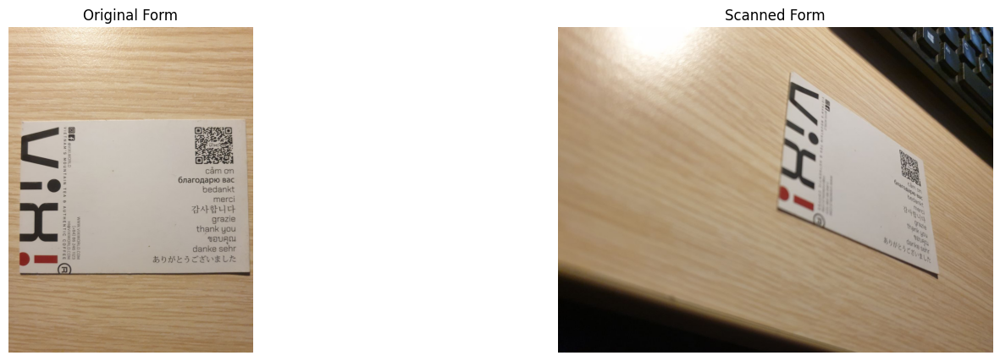

In [131]:
# Read reference image
refFilename = "image_align20.jpg"
# print("Reading reference image:", refFilename)
im1 = cv2.imread(refFilename, cv2.IMREAD_COLOR)
im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)

# Read image to be aligned
imFilename = "image_align22.jpg"
# print("Reading image to align:", imFilename)
im2 = cv2.imread(imFilename, cv2.IMREAD_COLOR)
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)

# Display Images
plt.figure(figsize=[18, 5]);
plt.subplot(121); plt.axis('off'); plt.imshow(im1); plt.title("Original Form")
plt.subplot(122); plt.axis('off'); plt.imshow(im2); plt.title("Scanned Form")

## find keypoints in both image

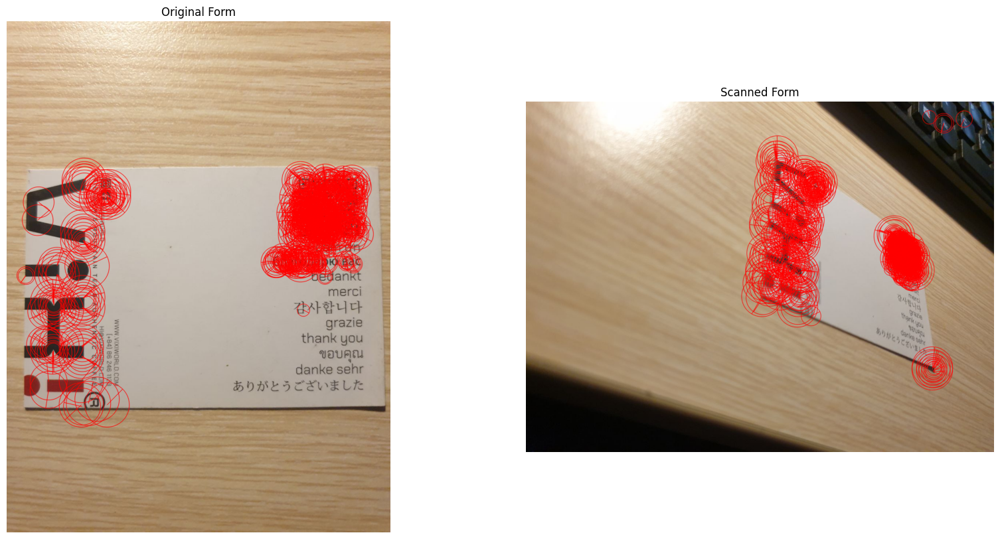

In [157]:
# Convert images to grayscale
im1_gray = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
im2_gray = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)


# Detect ORB features and compute descriptors.
MAX_NUM_FEATURES = 750
orb = cv2.ORB_create(MAX_NUM_FEATURES)
keypoints1, descriptors1 = orb.detectAndCompute(im1_gray, None)
keypoints2, descriptors2 = orb.detectAndCompute(im2_gray, None)

# Display
im1_display = cv2.drawKeypoints(im1, keypoints1, outImage=np.array([]),
                                color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

im2_display = cv2.drawKeypoints(im2, keypoints2, outImage=np.array([]),
                                color=(255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=[20,10])
plt.subplot(121); plt.axis('off'); plt.imshow(im1_display); plt.title("Original Form");
plt.subplot(122); plt.axis('off'); plt.imshow(im2_display); plt.title("Scanned Form");

## match keypoints in 2 images

Text(0.5, 1.0, 'Original Form')

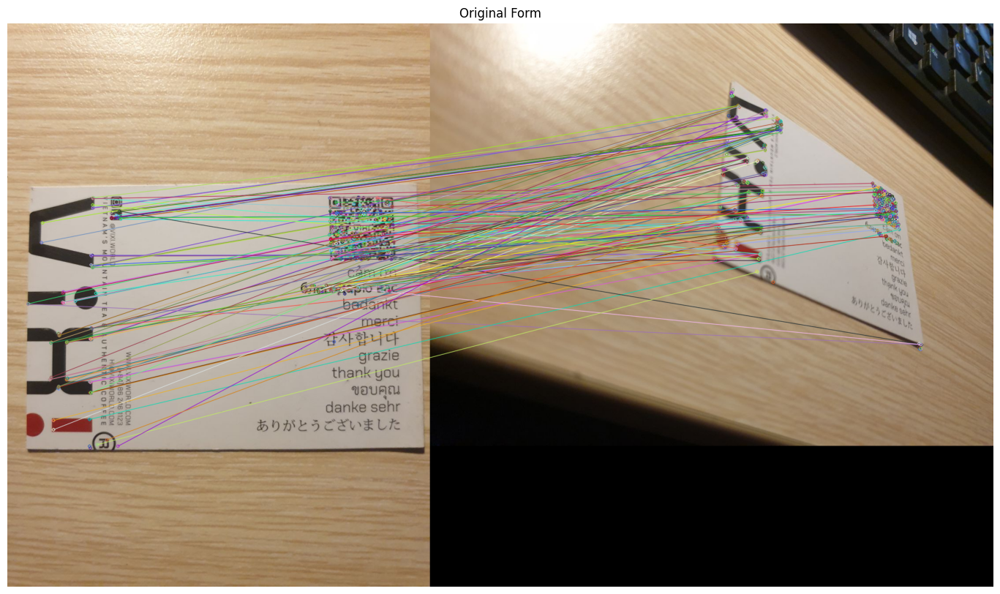

In [158]:
# Match features.
matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)

# Converting to list for sorting as tuples are immutable objects.
matches = list(matcher.match(descriptors1, descriptors2, None))

# Sort matches by score
matches.sort(key=lambda x: x.distance, reverse=False)

# Remove not so good matches
numGoodMatches = int(len(matches) * 0.2)
matches = matches[:numGoodMatches]

# Draw top matches
im_matches = cv2.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)

plt.figure(figsize=[40, 10])
plt.imshow(im_matches);plt.axis("off");plt.title("Original Form")

## find homography

In [159]:
# Extract location of good matches
points1 = np.zeros((len(matches), 2), dtype=np.float32)
points2 = np.zeros((len(matches), 2), dtype=np.float32)

for i, match in enumerate(matches):
    points1[i, :] = keypoints1[match.queryIdx].pt
    points2[i, :] = keypoints2[match.trainIdx].pt

# Find homography
h, mask = cv2.findHomography(points2, points1, cv2.RANSAC)

## Warp image

Text(0.5, 1.0, 'Scanned Form')

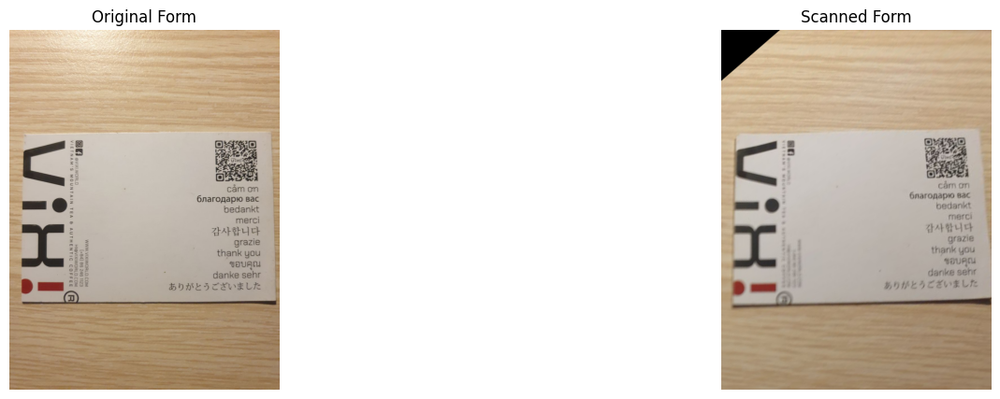

In [160]:
# Use homography to warp image
height, width, channels = im1.shape
im2_reg = cv2.warpPerspective(im2, h, (width, height))

# Display results
plt.figure(figsize=[18, 5])
plt.subplot(121);plt.imshow(im1);    plt.axis("off");plt.title("Original Form")
plt.subplot(122);plt.imshow(im2_reg);plt.axis("off");plt.title("Scanned Form")

##
https://www.youtube.com/watch?v=SQ3D1tlCtNg warp perspective 1 image

In [171]:
# img = cv2.imread('image_align21.jpg')

# # Pixel values in the original image
# input_points = np.float32([[83, 18], [342, 53], [14, 389], [295, 436]])

# # Output image size
# width = 400
# height = int(width * 1.414)  # for A4

# # Desired points values in the output image
# converted_points = np.float32([[0, 0], [width, 0], [0, height], [width, height]])

# # Perspective transformation
# matrix = cv2.getPerspectiveTransform(input_points, converted_points)
# img_output = cv2.warpPerspective(img, matrix, (width, height))

# cv2.imshow('Original', img)
# cv2.imshow('Warped perspective', img_output)

# # cv2.imwrite('output/document.jpg', img_output)

# cv2.waitKey(0)

-1

Text(0.5, 1.0, 'edged')

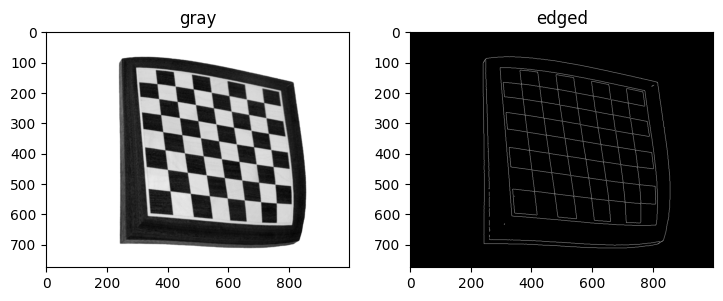

In [140]:
img = cv2.imread('image_align40b.png')
img_original = img.copy()

# Image modification
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
# gray = cv2.bilateralFilter(gray, 20, 30, 30)
# matrix = np.ones(gray.shape, dtype="uint8") * 150
# gray = gray - matrix
edged = cv2.Canny(gray, 80, 120)
img_original = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=[18, 5])
plt.subplot(141); plt.imshow(gray, cmap="gray"); plt.axis("on");plt.title("gray")
plt.subplot(142); plt.imshow(edged, cmap="gray"); plt.axis("on");plt.title("edged")

Text(0.5, 1.0, 'result')

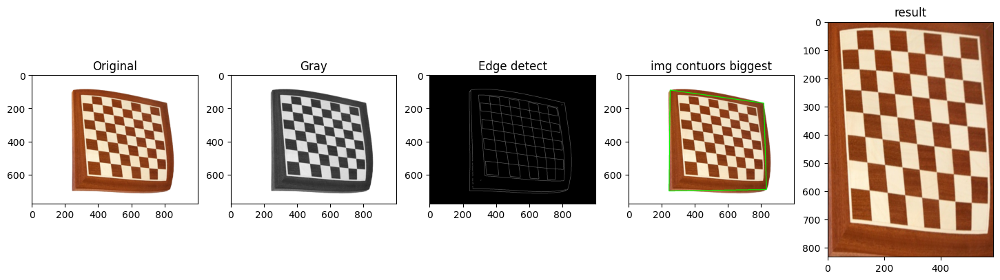

In [141]:
def biggest_contour(contours):
    biggest = np.array([])
    max_area = 0
    for i in contours:
        area = cv2.contourArea(i)
        if area > 1000:
            peri = cv2.arcLength(i, True)
            approx = cv2.approxPolyDP(i, 0.015 * peri, True)
            if area > max_area and len(approx) == 4:
                biggest = approx
                max_area = area
    return biggest
# Contour detection
contours, hierarchy = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]

biggest = biggest_contour(contours)

cv2.drawContours(img, [biggest], -1, (0, 255, 0), 3)

# Pixel values in the original image
points = biggest.reshape(4, 2)
input_points = np.zeros((4, 2), dtype="float32")

points_sum = points.sum(axis=1)
input_points[0] = points[np.argmin(points_sum)]
input_points[3] = points[np.argmax(points_sum)]

points_diff = np.diff(points, axis=1)
input_points[1] = points[np.argmin(points_diff)]
input_points[2] = points[np.argmax(points_diff)]

(top_left, top_right, bottom_right, bottom_left) = input_points
bottom_width = np.sqrt(((bottom_right[0] - bottom_left[0]) ** 2) + ((bottom_right[1] - bottom_left[1]) ** 2))
top_width = np.sqrt(((top_right[0] - top_left[0]) ** 2) + ((top_right[1] - top_left[1]) ** 2))
right_height = np.sqrt(((top_right[0] - bottom_right[0]) ** 2) + ((top_right[1] - bottom_right[1]) ** 2))
left_height = np.sqrt(((top_left[0] - bottom_left[0]) ** 2) + ((top_left[1] - bottom_left[1]) ** 2))

# Output image size
max_width = max(int(bottom_width), int(top_width))
max_height = max(int(right_height), int(left_height))
# max_height = int(max_width * 1.414)  # for A4
# max_height = max_width

# Desired points values in the output image
converted_points = np.float32([[0, 0], [max_width, 0], [0, max_height], [max_width, max_height]])

# Perspective transformation
matrix = cv2.getPerspectiveTransform(input_points, converted_points)
img_output = cv2.warpPerspective(img_original, matrix, (max_width, max_height))

# Image shape modification for hstack
gray = np.stack((gray,) * 3, axis=-1)
edged = np.stack((edged,) * 3, axis=-1)

img_hor = np.hstack((img_original, gray, edged, img))
plt.figure(figsize=[18, 5])
plt.subplot(151); plt.imshow(img_original); plt.axis("on");plt.title("Original")
plt.subplot(152); plt.imshow(gray); plt.axis("on");plt.title("Gray")
plt.subplot(153); plt.imshow(edged); plt.axis("on");plt.title("Edge detect")
plt.subplot(154); plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)); plt.axis("on");plt.title("img contuors biggest")
plt.subplot(155); plt.imshow(img_output); plt.axis("on");plt.title("result")
# cv2.imshow("Contour detection", img_hor)
# cv2.imshow("Warped perspective", img_output)

# cv2.imwrite('output/document.jpg', img_output)

# cv2.waitKey(0)

# Bài 9: Panorama

# Bài 10: Contour = Boundary